# pa005: High Value Customer Identification (Insiders)

## Solution Plan (IOT)

 ### 0.1. Input

1. Business problem
    - Select the most valuable costumers to join a loyalty program called "Insiders"
    

2. Data
    - Sales during the period of one year

 ### 0.2. Output

1. Refer some people elegible to be part of the loyalty program
            | client_id | is_insider | 
            | 20394     | yes(1)     |
            | 23948     | no (0)     |

 ### 0.3. Tasks

1. who are the people eligible for the loyalty program?
    - What does "being elegible" mean? Who are the "valuable customers"?
        - Invoicing:
            - High ATP
            - High LTV
            - Low recency
            - High basket size
            - Low probability of churn
        - Cost:
            - Low product return rate
        - Shopping Experience:       
            - High average rating
            
        
2. How many customers will be able to join the group?
    - Total number of customers
    - % Insiders Group
3. What are the main features of these customers?
        -  Age
        - Location
4. How much do the Insiders contribute to the total billing amount?
    - Total billing amout
    - % Insiders billing
5. Whet is the Insider's billing forecast for the coming months?
    - LTV Insiders group
    - Cohort analysis
6. What are the conditions to someone be elegible to the Insiders group?
    - The person has to be similar to the others in the group
8. How to ensure that the Insiders program is better tha the current model?
    - A/B test
    - Bayesian A/B test
    - Hypotesis test
9. What are the marketing plans for this group?
    - Discounts
    - Purchase preference
    - Free shipping

# 0.0. Imports

In [1]:
import pandas  as pd
import numpy   as np
import seaborn as sns

import umap.umap_ as umap

from matplotlib              import pyplot  as plt
from plotly                  import express as px
from IPython.display         import HTML

from dataprep.eda            import create_report
from dataprep.connector      import info_ui

from sklearn                 import cluster       as c
from sklearn                 import metrics       as m
from sklearn                 import preprocessing as pp
from sklearn                 import decomposition as dd
from sklearn.manifold        import TSNE
from sklearn.ensemble        import RandomForestRegressor
from sklearn.neighbors       import NearestNeighbors
from scipy.cluster           import hierarchy     as hc

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

import warnings
warnings.filterwarnings('ignore')

## 0.1 Helper Functions

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    display( HTML( '<style>.container { width:100% !important; }</style>') )


    sns.set()
jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## 0.2 Loading Dataset

In [3]:
# Load data
ecommerce = pd.read_csv('../data/Ecommerce.csv',encoding='latin1')

# Drop extra column
ecommerce = ecommerce.iloc[:,:-1]

# 1.0. Data description

In [4]:
ecommerce1 = ecommerce.copy()

## 1.1. Rename Columns

In [5]:
new_cols =  ['invoice_no', 'stock_code','description', 'quantity', 'invoice_date', 'unit_price', 'customer_id', 'country']
ecommerce1.columns = new_cols

## 1.2. Data Dimensions

In [6]:
ecommerce1.shape

(541909, 8)

## 1.3. Data types

In [7]:
ecommerce1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

## 1.4. Check NA

In [8]:
ecommerce1.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

## 1.5. Replace NA

In [9]:
# Missing values on customer ID
ecommerce_missing = ecommerce1[ecommerce1['customer_id'].isna()]
ecommerce_not_missing = ecommerce1[~ecommerce1['customer_id'].isna()]

In [10]:
ecommerce_missing_customerid = ecommerce_missing[['invoice_no','customer_id']].drop_duplicates()
ecommerce_missing_customerid['customer_id'] = np.arange( 19000, 19000 + len(ecommerce_missing_customerid), 1 )
ecommerce_missing = pd.merge(ecommerce_missing.drop('customer_id', axis = 1), ecommerce_missing_customerid, on = 'invoice_no', how = 'left')
ecommerce_missing = ecommerce_missing[ecommerce_not_missing.columns]
ecommerce1 = pd.concat([ecommerce_missing, ecommerce_not_missing])

In [11]:
# Drop description column
ecommerce1 = ecommerce1.drop('description', axis = 1)

In [12]:
ecommerce1.isna().sum()

invoice_no      0
stock_code      0
quantity        0
invoice_date    0
unit_price      0
customer_id     0
country         0
dtype: int64

## 1.6. Change Dtypes

In [13]:
# Invoice date
ecommerce1['invoice_date'] = pd.to_datetime(ecommerce1['invoice_date'], format = '%d-%b-%y')

# Customer id
ecommerce1['customer_id'] = ecommerce1['customer_id'].astype(np.int64)

In [14]:
ecommerce1.sort_values('invoice_no').head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,6,2016-11-29,2.55,17850,United Kingdom
6,536365,21730,6,2016-11-29,4.25,17850,United Kingdom
5,536365,22752,2,2016-11-29,7.65,17850,United Kingdom
1,536365,71053,6,2016-11-29,3.39,17850,United Kingdom
3,536365,84029G,6,2016-11-29,3.39,17850,United Kingdom


## 1.7. Drop Duplicates

In [15]:
#ecommerce1 = ecommerce1.drop_duplicates()

## 1.8. Descriptive Statistics

In [16]:
num_attributes = ecommerce1.select_dtypes( include = ['int64', 'float64'])
cat_attributes = ecommerce1.select_dtypes( exclude = ['int64', 'float64', 'datetime64[ns]'])

### 1.8.1. Numerical Attributes

In [17]:
# Central tendency (mean, median)
ct1 = ( num_attributes.apply( np.mean ) ).T
ct2 = ( num_attributes.apply( np.median ) ).T
# Dispersion ( std, min, max. range, skew, kurtosis)
d1 = ( num_attributes.apply( np.std ) ).T
d2 = ( num_attributes.apply( np.min ) ).T
d3 = ( num_attributes.apply( np.max ) ).T
d4 = ( num_attributes.apply( lambda x: x.max() - x.min() ) ).T
d5 = ( num_attributes.apply( lambda x: x.max() - x.skew() ) ).T
d6 = ( num_attributes.apply( lambda x: x.max() - x.kurtosis() ) ).T

# Concatenate
ecommerce_stats = pd.concat( [d2, d3, d4, ct1, ct2, d1, d5, d6], axis = 1 ).reset_index()
ecommerce_stats.columns = ['attributes','min','max', 'range', 'mean', 'median',' std',' skew', 'kurtosis']
ecommerce_stats

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,quantity,-80995.00,80995.0,161990.00,9.552250,3.00,218.080957,80995.264076,-38774.160031
1,unit_price,-11062.06,38970.0,50032.06,4.611114,2.08,96.759764,38783.493028,-20035.719097
2,customer_id,12346.00,22709.0,10363.00,16688.840453,16249.00,2911.408666,22708.512551,22709.804287


#### 1.8.1.1. Numerical attributes - Investigating

In [18]:
# Negative values for quantity
# Negative values for unit price

### 1.8.2. Categorical Attributes

##### Invoice Number

In [18]:
 # Invoice number
invoices_w_letters = ecommerce1.loc[ecommerce1['invoice_no'].apply( lambda x: bool( re.search( '[^0-9]+', x ) ) ), : ]
negative_quantity = len( invoices_w_letters.loc[invoices_w_letters['quantity'] < 0, : ] )
print('Total number of invoices number with letter: ',len( invoices_w_letters ), '\nTotal number of negative quantity: ', negative_quantity)

Total number of invoices number with letter:  9291 
Total number of negative quantity:  9288


##### Stock code

In [19]:
# Stock code
# Check only characters on stock code
ecommerce1.loc[ecommerce1['stock_code'].apply( lambda x: bool( re.search( '^[a-zA-Z]+$',  x ) ) ), 'stock_code' ].unique()

# Action: Remove stock code in ['DOT', 'M', 'S', 'AMAZONFEE', 'm', 'POST', 'DCGSSBOY', 'DCGSSGIRL', 'B', 'D', 'PADS', 'CRUK']


array(['DOT', 'M', 'S', 'AMAZONFEE', 'm', 'POST', 'DCGSSBOY', 'DCGSSGIRL',
       'B', 'D', 'PADS', 'CRUK'], dtype=object)

##### Description

In [21]:
# Action: delete description

##### Country

In [22]:
ecommerce1['country'].unique()

array(['United Kingdom', 'EIRE', 'Bahrain', 'Israel', 'Hong Kong',
       'Unspecified', 'France', 'Switzerland', 'Portugal', 'Australia',
       'Netherlands', 'Germany', 'Norway', 'Spain', 'Poland', 'Italy',
       'Belgium', 'Lithuania', 'Japan', 'Iceland', 'Channel Islands',
       'Denmark', 'Cyprus', 'Sweden', 'Austria', 'Finland', 'Greece',
       'Singapore', 'Lebanon', 'United Arab Emirates', 'Saudi Arabia',
       'Czech Republic', 'Canada', 'Brazil', 'USA', 'European Community',
       'Malta', 'RSA'], dtype=object)

In [23]:
ecommerce1['country'].value_counts(normalize = True)#.head(4)

United Kingdom          0.914320
Germany                 0.017521
France                  0.015790
EIRE                    0.015124
Spain                   0.004674
Netherlands             0.004375
Belgium                 0.003818
Switzerland             0.003694
Portugal                0.002803
Australia               0.002323
Norway                  0.002004
Italy                   0.001482
Channel Islands         0.001399
Finland                 0.001283
Cyprus                  0.001148
Sweden                  0.000853
Unspecified             0.000823
Austria                 0.000740
Denmark                 0.000718
Japan                   0.000661
Poland                  0.000629
Israel                  0.000548
USA                     0.000537
Hong Kong               0.000531
Singapore               0.000423
Iceland                 0.000336
Canada                  0.000279
Greece                  0.000269
Malta                   0.000234
United Arab Emirates    0.000125
European C

In [24]:
ecommerce1[['customer_id','country']].drop_duplicates().groupby('country').count().reset_index().sort_values(by = 'customer_id', ascending = False).head(4)

,country,customer_id
36,United Kingdom,7587
14,Germany,95
13,France,90
10,EIRE,44


# 2.0. Data Filtering

In [25]:
ecommerce2 = ecommerce1

In [26]:
# Categorical attributes

# Stock code
ecommerce2 = ecommerce2[~ecommerce2['stock_code'].isin(['DOT', 'M', 'S', 'AMAZONFEE', 'm', 'POST', 'DCGSSBOY', 'DCGSSGIRL', 'B', 'D', 'PADS', 'CRUK'])]

# Country
ecommerce2 = ecommerce2[~ecommerce2['country'].isin( ['European Community', 'Unspecified'] )] 

# Numerical attributes

# Unit price
ecommerce2 = ecommerce2[ecommerce2['unit_price'] >= 0.04]

# Bad users
ecommerce2 = ecommerce2[~ecommerce2['customer_id'].isin( [16446] )]

# Quantity
ecommerce_returns = ecommerce2.loc[ecommerce2['quantity'] < 0, : ] 
ecommerce_purchases = ecommerce2.loc[ecommerce2['quantity'] >= 0, : ] 

# 3.0. Feature Engineering

In [27]:
ecommerce3 = ecommerce2

In [28]:
customer_df = ecommerce3.drop(['invoice_no', 'stock_code', 'quantity', 'invoice_date', 'unit_price', 'country'], axis = 1).drop_duplicates(ignore_index = True)

## 3.1. Feature Creation

### 3.1.1. Gross Revenue

In [29]:
# Gross Revenue
ecommerce_purchases['gross_revenue'] = ecommerce_purchases['quantity'] * ecommerce_purchases['unit_price']
df_gross_revenue = ecommerce_purchases[['gross_revenue','customer_id']].groupby('customer_id').sum().reset_index()
customer_df = pd.merge(customer_df, df_gross_revenue,on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id       0
gross_revenue    91
dtype: int64

### 3.1.2. Recency

In [30]:
# Recency - Last day purchase
df_recency = ecommerce_purchases[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index()
df_recency['recency'] = (ecommerce_purchases['invoice_date'].max() - df_recency['invoice_date']).dt.days
df_recency = df_recency[['customer_id','recency']].copy()

# Merge
customer_df = pd.merge(customer_df, df_recency, on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id       0
gross_revenue    91
recency          91
dtype: int64

### 3.1.3. Quantity of purchases

In [31]:
# qtty purchased
df_frequency = ecommerce_purchases[['invoice_no', 'customer_id']].drop_duplicates().groupby('customer_id').count().reset_index().rename(columns = {'invoice_no' : 'qtty_invoices'})

# Merge
customer_df = pd.merge(customer_df, df_frequency, on = 'customer_id', how = 'left')
customer_df.isna().sum()

customer_id       0
gross_revenue    91
recency          91
qtty_invoices    91
dtype: int64

### 3.1.4. Quantity of items purchased

In [32]:
# qtty purchased
df_products = ecommerce_purchases[['quantity', 'customer_id']].groupby('customer_id').sum().reset_index().rename(columns = {'quantity' : 'qtty_items'})

# Merge
customer_df = pd.merge(customer_df, df_products, on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id       0
gross_revenue    91
recency          91
qtty_invoices    91
qtty_items       91
dtype: int64

### 3.1.5. Quantity of products purchased

In [33]:
# qtty purchased
df_products = ecommerce_purchases[['stock_code', 'customer_id']].groupby('customer_id').count().reset_index().rename(columns = {'stock_code' : 'qtty_products'})

# Merge
customer_df = pd.merge(customer_df, df_products, on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id       0
gross_revenue    91
recency          91
qtty_invoices    91
qtty_items       91
qtty_products    91
dtype: int64

### 3.1.6. Average Ticket

In [34]:
# AVG Ticket
df_avgticket = ecommerce_purchases[['customer_id','gross_revenue']].groupby('customer_id').mean().reset_index().rename(columns = {'gross_revenue':'avg_ticket'})

# Merge
customer_df = pd.merge(customer_df, df_avgticket, on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id       0
gross_revenue    91
recency          91
qtty_invoices    91
qtty_items       91
qtty_products    91
avg_ticket       91
dtype: int64

### 3.1.7. Average Recency Days

In [35]:
# AVG Recency days
aux_recency = ecommerce2[['customer_id','invoice_date']].drop_duplicates().sort_values( ['customer_id','invoice_date'], ascending = [True, True])
aux_recency['next_customer_id'] = aux_recency['customer_id'].shift()
aux_recency['previous_date'] = aux_recency['invoice_date'].shift()
aux_recency['avg_recency_days'] = aux_recency.apply( lambda x:( ( x['invoice_date'] - x['previous_date'] ).days if x['customer_id'] == x['next_customer_id'] else np.nan), axis = 1 )
aux_recency = aux_recency.drop( ['invoice_date','next_customer_id','previous_date'], axis = 1).dropna()
aux_recency = aux_recency.groupby('customer_id').mean().reset_index()

# Merge
customer_df = pd.merge(customer_df, aux_recency, on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id            0
gross_revenue         91
recency               91
qtty_invoices         91
qtty_items            91
qtty_products         91
avg_ticket            91
avg_recency_days    2816
dtype: int64

### 3.1.8. Fequecy Purchase

In [36]:
# Frquency purchase
frequency_df = (
                ecommerce2[['customer_id','invoice_no', 'invoice_date']].drop_duplicates()
                                                                        .groupby('customer_id')
                                                                        .agg( max_date = ('invoice_date', 'max'),
                                                                              min_date = ('invoice_date', 'min'),
                                                                              qtty_purchases = ('invoice_no', 'count')     
                                                                            ).reset_index()
              )
frequency_df['date_interval'] = ((frequency_df['max_date'] - frequency_df['min_date']).dt.days)
frequency_df['frequency'] = frequency_df.apply(lambda x: ( x['qtty_purchases'] / x['date_interval'] ) if x['date_interval'] != 0 else 0, axis = 1 )

# Merge
customer_df = pd.merge(customer_df, frequency_df[['customer_id','frequency']], on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id            0
gross_revenue         91
recency               91
qtty_invoices         91
qtty_items            91
qtty_products         91
avg_ticket            91
avg_recency_days    2816
frequency              0
dtype: int64

### 3.1.9. Returns

In [37]:
# Number of returns
customer_returns = ecommerce_returns[['customer_id','quantity']].groupby('customer_id').sum().reset_index().rename(columns = {'quantity' : 'qtty_returns'})
customer_returns['qtty_returns'] = customer_returns['qtty_returns'] * - 1

# Merge
customer_df = pd.merge(customer_df, customer_returns, on = 'customer_id', how = 'left')
customer_df.loc[customer_df['qtty_returns'].isna(),'qtty_returns'] = 0

customer_df.isna().sum()

customer_id            0
gross_revenue         91
recency               91
qtty_invoices         91
qtty_items            91
qtty_products         91
avg_ticket            91
avg_recency_days    2816
frequency              0
qtty_returns           0
dtype: int64

### 3.1.10. Basket Size

In [38]:
basket_size = (ecommerce_purchases[['customer_id', 'invoice_no', 'quantity']].groupby('customer_id')
                                                                 .agg(invoices = ('invoice_no','nunique'),
                                                                      products = ('quantity','sum')).reset_index() 
                
)

basket_size['basket_size'] = basket_size['products'] / basket_size['invoices']

# Merge
customer_df = pd.merge(customer_df, basket_size[['customer_id','basket_size']], on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id            0
gross_revenue         91
recency               91
qtty_invoices         91
qtty_items            91
qtty_products         91
avg_ticket            91
avg_recency_days    2816
frequency              0
qtty_returns           0
basket_size           91
dtype: int64

### 3.1.11. Unique Basket Size

In [39]:
avg_basket_size = ( ecommerce_purchases[['customer_id', 'invoice_no', 'stock_code']].groupby('customer_id')
                                                                 .agg( invoices = ('invoice_no','nunique'),
                                                                       products = ('stock_code','nunique') ).reset_index() 
                
                  )

avg_basket_size['unique_basket_size'] = avg_basket_size['products'] / avg_basket_size['invoices']

# Merge
customer_df = pd.merge(customer_df, avg_basket_size[['customer_id','unique_basket_size']], on = 'customer_id', how = 'left')

customer_df.isna().sum()

customer_id              0
gross_revenue           91
recency                 91
qtty_invoices           91
qtty_items              91
qtty_products           91
avg_ticket              91
avg_recency_days      2816
frequency                0
qtty_returns             0
basket_size             91
unique_basket_size      91
dtype: int64

# 4.0. Exploratory Data Analysis

In [40]:
ecommerce4 = customer_df.dropna().copy()

In [41]:
ecommerce4

,customer_id,gross_revenue,recency,qtty_invoices,qtty_items,qtty_products,avg_ticket,avg_recency_days,frequency,qtty_returns,basket_size,unique_basket_size
1430,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,35.500000,0.492958,40.0,50.970588,0.617647
1431,13047,3232.59,56.0,9.0,1390.0,171.0,18.904035,27.250000,0.048930,35.0,154.444444,11.666667
1432,12583,6705.38,2.0,15.0,5028.0,232.0,28.902500,23.187500,0.045822,50.0,335.200000,7.600000
1433,13748,948.25,95.0,5.0,439.0,28.0,33.866071,92.666667,0.017986,0.0,87.800000,4.800000
1434,15100,876.00,333.0,3.0,80.0,3.0,292.000000,8.600000,0.139535,22.0,26.666667,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...
5719,12479,473.20,11.0,1.0,382.0,30.0,15.773333,4.000000,0.375000,34.0,382.000000,30.000000
5734,14126,706.13,7.0,3.0,508.0,15.0,47.075333,3.000000,1.333333,50.0,169.333333,4.666667
5738,13521,1092.39,1.0,3.0,733.0,435.0,2.511241,4.500000,0.333333,0.0,244.333333,104.000000
5743,15060,301.84,8.0,4.0,262.0,120.0,2.515333,1.000000,4.000000,0.0,65.500000,20.000000


## 4.1. Univariate Analysis

Metrics: min, max, range, dispertion

         men, median 
         
         std, variance
         
         coefficient of variation (cv)
         
         distribution
         
Conclusions:

Gross Revenue - ok

Recency - ok

Qtty invoices - ok

Qtty intems

Qtty products


  0%|                                                  | 0/2423 [00:00<?, ?it/s]


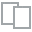
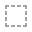
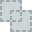
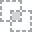
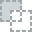
...
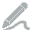
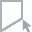
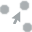
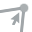
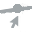

In [42]:
report = create_report(ecommerce4).show()

### 4.1.1. Gross Revenue

In [43]:
ecommerce4.sort_values('gross_revenue', ascending = False).head(5)

,customer_id,gross_revenue,recency,qtty_invoices,qtty_items,qtty_products,avg_ticket,avg_recency_days,frequency,qtty_returns,basket_size,unique_basket_size
2338,14646,279138.02,1.0,72.0,196844.0,2060.0,135.503893,7.844444,0.206799,288.0,2733.944444,9.708333
1879,18102,259657.30,0.0,60.0,64124.0,431.0,602.453132,14.680000,0.163488,0.0,1068.733333,2.500000
1831,17450,194550.79,8.0,46.0,69993.0,337.0,577.302047,12.821429,0.136490,952.0,1521.586957,2.695652
1496,14911,140450.72,1.0,199.0,80263.0,5673.0,24.757751,2.601399,0.653226,3332.0,403.331658,8.974874
2409,12415,124564.53,24.0,20.0,77373.0,713.0,174.704811,20.866667,0.076677,427.0,3868.650000,22.150000


### 4.1.2. Qtty Products

In [44]:
ecommerce4[ecommerce4['qtty_products'] == 7667]

,customer_id,gross_revenue,recency,qtty_invoices,qtty_items,qtty_products,avg_ticket,avg_recency_days,frequency,qtty_returns,basket_size,unique_basket_size


### 4.1.3. AVG Ticket

In [45]:
ecommerce4.sort_values('avg_ticket', ascending = False).head(5)

,customer_id,gross_revenue,recency,qtty_invoices,qtty_items,qtty_products,avg_ticket,avg_recency_days,frequency,qtty_returns,basket_size,unique_basket_size
2505,15749,44534.30,235.0,3.0,18028.0,10.0,4453.4300,97.0,0.041237,9014.0,6009.333333,1.666667
2942,18087,3202.92,290.0,1.0,3906.0,1.0,3202.9200,78.5,0.019108,336.0,3906.000000,1.000000
2399,16532,6748.80,17.0,3.0,2016.0,4.0,1687.2000,160.5,0.009346,0.0,672.000000,0.666667
1982,12755,3811.95,280.0,2.0,1491.0,4.0,952.9875,58.0,0.025862,624.0,745.500000,2.000000
4368,12798,6977.04,10.0,3.0,5256.0,8.0,872.1300,80.0,0.018750,0.0,1752.000000,2.000000


In [46]:
ecommerce[ecommerce['CustomerID'] == 16446] # Action: remove this customer

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
194354,553573,22980,PANTRY SCRUBBING BRUSH,1,16-May-17,1.65,16446.0,United Kingdom
194355,553573,22982,PANTRY PASTRY BRUSH,1,16-May-17,1.25,16446.0,United Kingdom
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,7-Dec-17,2.08,16446.0,United Kingdom
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,7-Dec-17,2.08,16446.0,United Kingdom


### 4.1.4. Frequency

In [47]:
ecommerce4[ecommerce4['frequency'] > 3]

,customer_id,gross_revenue,recency,qtty_invoices,qtty_items,qtty_products,avg_ticket,avg_recency_days,frequency,qtty_returns,basket_size,unique_basket_size
5663,18139,8438.34,17.0,6.0,5557.0,159.0,53.071321,1.0,6.0,0.0,926.166667,5.833333
5743,15060,301.84,8.0,4.0,262.0,120.0,2.515333,1.0,4.0,0.0,65.500000,20.000000


### 4.1.5. AVG Basket Size

In [48]:
ecommerce4[ecommerce4['basket_size'] > 4000]

,customer_id,gross_revenue,recency,qtty_invoices,qtty_items,qtty_products,avg_ticket,avg_recency_days,frequency,qtty_returns,basket_size,unique_basket_size
2505,15749,44534.30,235.0,3.0,18028.0,10.0,4453.430000,97.0,0.041237,9014.0,6009.333333,1.666667
4036,12590,9341.26,211.0,1.0,4282.0,67.0,139.421791,21.0,0.095238,4.0,4282.000000,67.000000


In [49]:
ecommerce3[ecommerce3['customer_id'].isin([15749,12590])].head(15)

,invoice_no,stock_code,quantity,invoice_date,unit_price,customer_id,country
52709,540815,85123A,1930,2017-01-09,2.55,15749,United Kingdom
52710,540815,21175,2000,2017-01-09,1.85,15749,United Kingdom
52711,540815,21108,3114,2017-01-09,2.10,15749,United Kingdom
52771,540818,47556B,1300,2017-01-09,2.55,15749,United Kingdom
52772,540818,48185,670,2017-01-09,6.75,15749,United Kingdom
160141,C550456,48185,-670,2017-04-16,6.75,15749,United Kingdom
160142,C550456,47566B,-1300,2017-04-16,2.55,15749,United Kingdom
160143,C550456,85123A,-1930,2017-04-16,2.55,15749,United Kingdom
160144,C550456,21175,-2000,2017-04-16,1.85,15749,United Kingdom
160145,C550456,21108,-3114,2017-04-16,2.10,15749,United Kingdom


## 4.2. Bivariate Analysis

<Figure size 2500x1200 with 0 Axes>

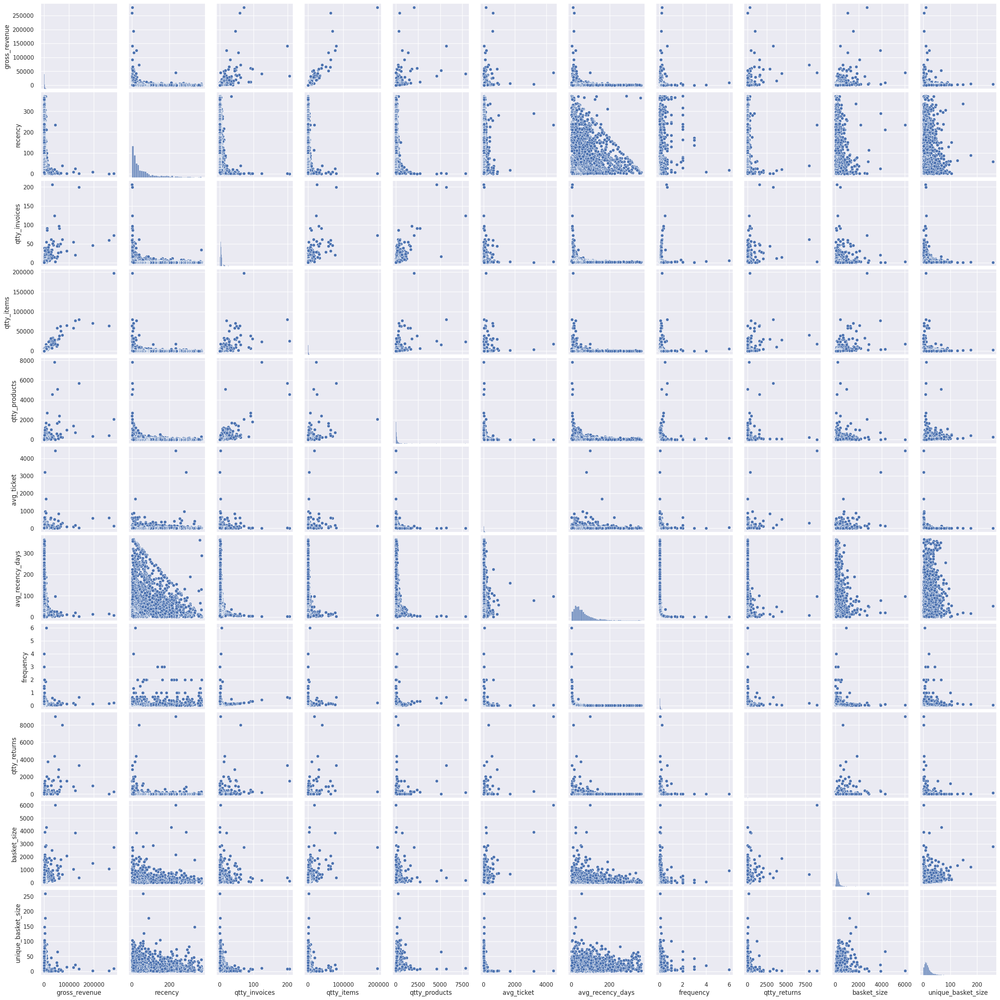

In [50]:
ecommerce_pairplot = ecommerce4.drop('customer_id', axis = 1)
plt.figure( figsize = ( 25, 12 ))
sns.pairplot( ecommerce_pairplot )

- Frequency has low variance
- AVG Ticket has low variance

## 4.3. Space Study

In [360]:
# Original dataset
#ecommerce4_3 = ecommerce4.drop(columns = ['customer_id'], axis = 1).copy()

# Selected dataset
selected_cols = ['customer_id', 'gross_revenue', 'recency', 'qtty_products', 'frequency', 'qtty_returns']
ecommerce4_3 = ecommerce4[selected_cols]

In [361]:
# Minmax Scaler
mm = pp.MinMaxScaler() # not normal distribution
ss = pp.StandardScaler() # normal distribution without outliers
rs = pp.RobustScaler() # normal distribution with outliers

ecommerce4_3['gross_revenue']      = mm.fit_transform(ecommerce4_3[['gross_revenue']])

ecommerce4_3['recency']            = mm.fit_transform(ecommerce4_3[['recency']])

# ecommerce4_3['qtty_invoices']      = mm.fit_transform(ecommerce4_3[['qtty_invoices']])

# ecommerce4_3['qtty_items']         = mm.fit_transform(ecommerce4_3[['qtty_items']])# 

ecommerce4_3['qtty_products']      = mm.fit_transform(ecommerce4_3[['qtty_products']])

# ecommerce4_3['avg_ticket']         = mm.fit_transform(ecommerce4_3[['avg_ticket']])

#ecommerce4_3['avg_recency_days']   = mm.fit_transform(ecommerce4_3[['avg_recency_days']])

ecommerce4_3['frequency']          = mm.fit_transform(ecommerce4_3[['frequency']])

ecommerce4_3['qtty_returns']       = mm.fit_transform(ecommerce4_3[['qtty_returns']])

# ecommerce4_3['basket_size']        = mm.fit_transform(ecommerce4_3[['basket_size']])

# ecommerce4_3['unique_basket_size'] = mm.fit_transform(ecommerce4_3[['unique_basket_size']])

X = ecommerce4_3.iloc[:,1:].copy()

### 4.3.1. PCA

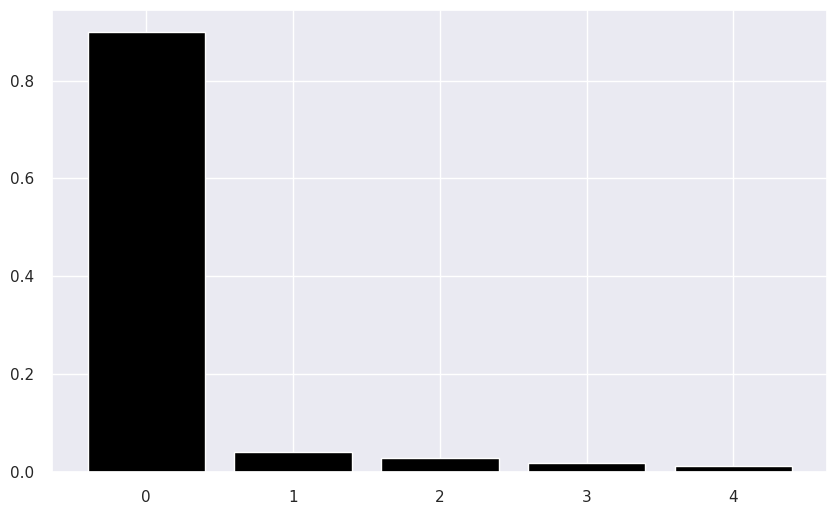

In [362]:
pca = dd.PCA( n_components = X.shape[1] )
principal_components = pca.fit_transform( X )

# Prot explained variable
features = range(pca.n_components_)

plt.figure( figsize = ( 10, 6 ))
plt.bar(features, pca.explained_variance_ratio_, color = 'black')

# pca component
df_pca = pd.DataFrame( principal_components )

<AxesSubplot: xlabel='0', ylabel='1'>

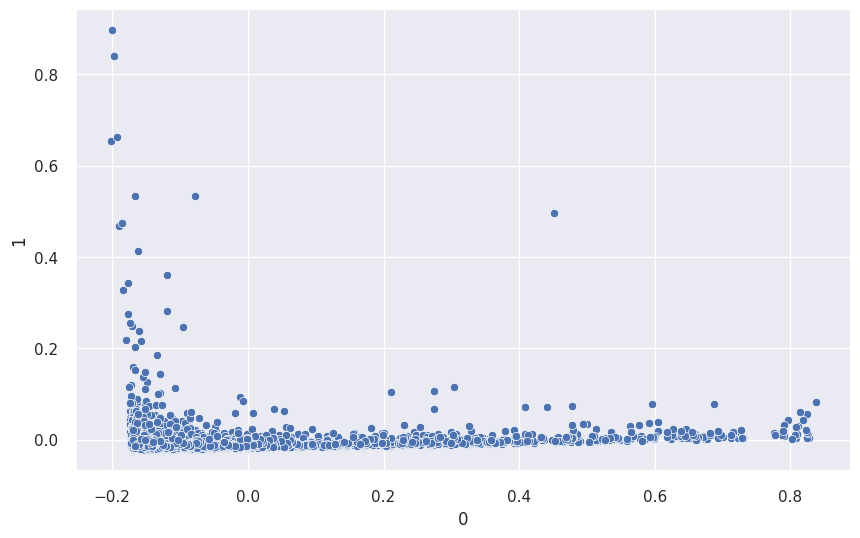

In [363]:
plt.figure( figsize = ( 10, 6 ))
sns.scatterplot( x = 0, y = 1, data = df_pca )

### 4.3.2. UMAP

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

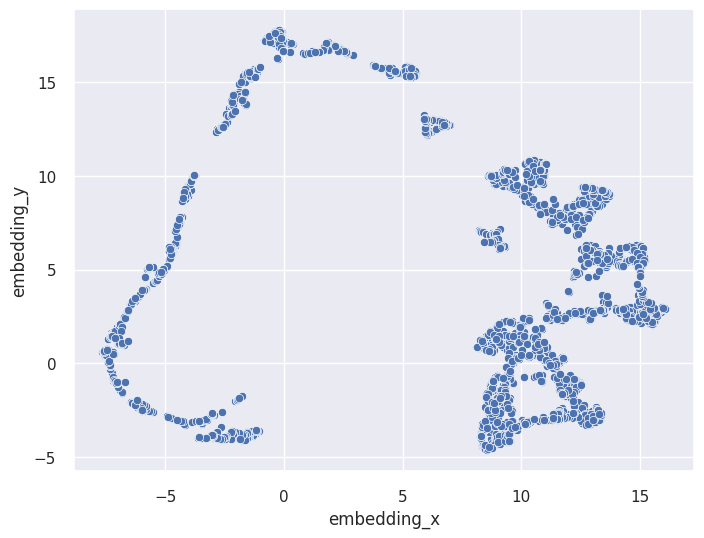

In [366]:
df_umap = df_pca.copy()
reducer = umap.UMAP( random_state = 42 )
embedding = reducer.fit_transform( X )

# embedding
df_umap['embedding_x'] = embedding[: , 0]
df_umap['embedding_y'] = embedding[: , 1]

# Plot UMAP
plt.figure(figsize=(8, 6))
sns.scatterplot( x = 'embedding_x', y = 'embedding_y',
                 data = df_umap )

### 4.3.3. t-SNE

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

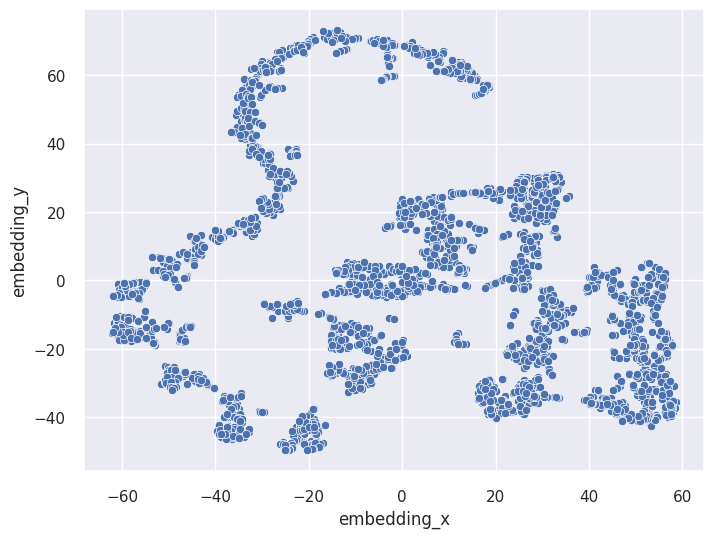

In [368]:
df_tsne = df_pca.copy()
reducer = TSNE( n_components = 2, random_state = 42, n_jobs = -1 )
embedding = reducer.fit_transform( X )

# embedding
df_tsne['embedding_x'] = embedding[: , 0]
df_tsne['embedding_y'] = embedding[: , 1]

# Plot UMAP
plt.figure(figsize=(8, 6))
sns.scatterplot( x = 'embedding_x', y = 'embedding_y',
                 data = df_tsne )

### 4.3.4. Tree-Based Embedding

In [369]:
y = X['gross_revenue']
X = X.drop('gross_revenue', axis = 1)

In [370]:
# Model definition
rf_model = RandomForestRegressor( n_estimators = 100, random_state = 42 )

# Model training
rf_model.fit( X, y )

# Leaf
df_leaf = pd.DataFrame( rf_model.apply( X ) )

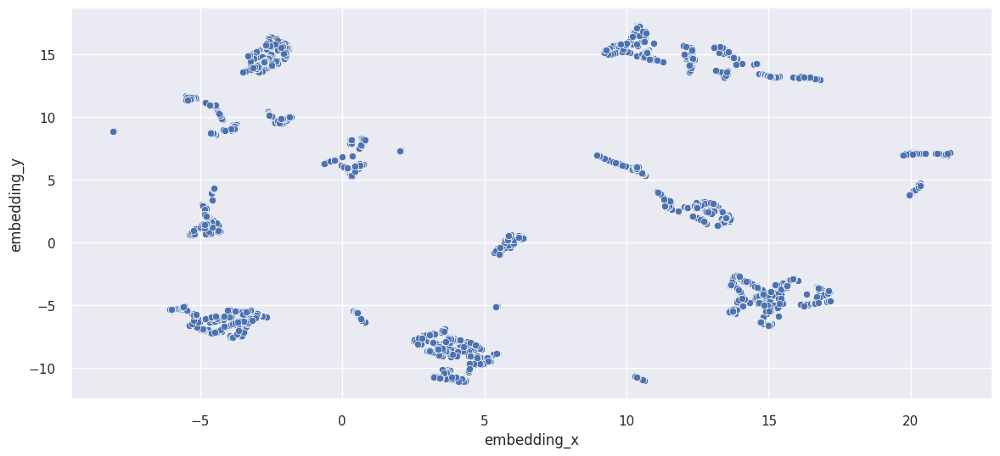

In [371]:
reducer = umap.UMAP( random_state = 42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_leaf['embedding_x'] = embedding[: , 0]
df_leaf['embedding_y'] = embedding[: , 1]


# Plot UMAP
plt.figure(figsize=(14, 6))
sns.scatterplot( x = 'embedding_x', y = 'embedding_y',
                 data = df_leaf )

df_leaf = df_leaf [['embedding_x', 'embedding_y']]

In [375]:
df_leaf

,embedding_x,embedding_y
0,12.210347,15.512683
1,19.892588,7.092259
2,13.512303,15.278953
3,-4.501671,1.600363
4,-4.570382,8.756630
...,...,...
2963,-4.781623,2.109573
2964,-4.659839,10.924990
2965,9.298332,15.361846
2966,11.332650,2.930159


# 5.0. Data Preparation

In [394]:
ecommerce5 = df_leaf.copy()
ecommerce5['customer_id'] = ecommerce4_3['customer_id'].tolist()

## 5.1. Normalization

## 5.1. Rescaling

In [121]:
# # Minmax Scaler
# mm = pp.MinMaxScaler() # not normal distribution
# ss = pp.StandardScaler() # normal distribution without outliers
# rs = pp.RobustScaler() # normal distribution with outliers

# ecommerce5['gross_revenue']      = mm.fit_transform(ecommerce5[['gross_revenue']])

# ecommerce5['recency']            = mm.fit_transform(ecommerce5[['recency']])

# ecommerce5['qtty_invoices']      = mm.fit_transform(ecommerce5[['qtty_invoices']])

# ecommerce5['qtty_items']         = mm.fit_transform(ecommerce5[['qtty_items']])

# ecommerce5['qtty_products']      = mm.fit_transform(ecommerce5[['qtty_products']])

# ecommerce5['avg_ticket']         = mm.fit_transform(ecommerce5[['avg_ticket']])

# ecommerce5['avg_recency_days']   = mm.fit_transform(ecommerce5[['avg_recency_days']])

# ecommerce5['frequency']          = mm.fit_transform(ecommerce5[['frequency']])

# ecommerce5['qtty_returns']       = mm.fit_transform(ecommerce5[['qtty_returns']])

# ecommerce5['basket_size']        = mm.fit_transform(ecommerce5[['basket_size']])

# ecommerce5['unique_basket_size'] = mm.fit_transform(ecommerce5[['unique_basket_size']])

## 5.1. Transformation

# 6.0. Feature Selection

In [123]:
#cols_select = ['customer_id','gross_revenue', 'recency', 'qtty_products', 'frequency', 'qtty_returns']

In [395]:
#ecommerce6 = ecommerce5[cols_select].copy()
ecommerce6 = ecommerce5.copy()

# 7.0. Hyperparameter Fine -Tunning

In [401]:
ecommerce7 = ecommerce6.copy()
X = ecommerce6.iloc[:,:-1].copy()#ecommerce7.drop('customer_id', axis = 1).copy()

In [402]:
clusters = np.arange(2, 26, 1)

## 7.1. K-Means

In [403]:
kmeans_scores = []

for k in clusters:
    # model definition
    kmeans_model = c.KMeans(n_clusters = k)

    # model training
    kmeans_model.fit ( X )

    # medel predict
    labels = kmeans_model.predict( X )

    # model performance
    sil = m.silhouette_score( X, labels, metric = 'euclidean' )
    kmeans_scores.append( sil )
    print ( "K = ", k, "Silhouette = ",sil )

K =  2 Silhouette =  0.39546067
K =  3 Silhouette =  0.47928745
K =  4 Silhouette =  0.5500553
K =  5 Silhouette =  0.5492332
K =  6 Silhouette =  0.59242064
K =  7 Silhouette =  0.6418096
K =  8 Silhouette =  0.64074033
K =  9 Silhouette =  0.65755725
K =  10 Silhouette =  0.6819261
K =  11 Silhouette =  0.713209
K =  12 Silhouette =  0.68548906
K =  13 Silhouette =  0.69079965
K =  14 Silhouette =  0.6942375
K =  15 Silhouette =  0.66502255
K =  16 Silhouette =  0.669733
K =  17 Silhouette =  0.61273277
K =  18 Silhouette =  0.62455237
K =  19 Silhouette =  0.6167269
K =  20 Silhouette =  0.61200696
K =  21 Silhouette =  0.6165528
K =  22 Silhouette =  0.63654554
K =  23 Silhouette =  0.59598035
K =  24 Silhouette =  0.6198519
K =  25 Silhouette =  0.6540678


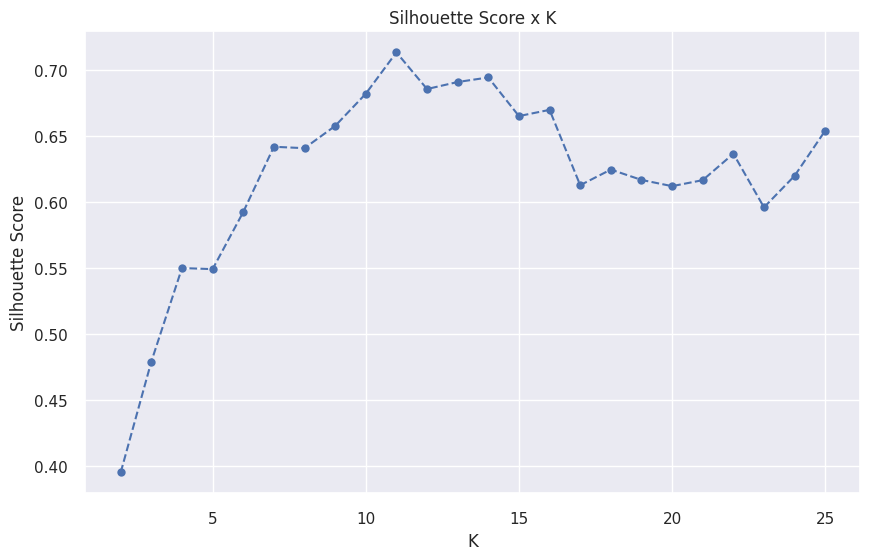

In [404]:
plt.figure( figsize = ( 10, 6 ))
plt.plot( clusters, kmeans_scores, linestyle = '--', marker = 'o', color = 'b')
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 7.2. GMM

In [405]:
from sklearn import mixture as mx

gmm_scores = []

for k in clusters:
    # model definition
    gmm_model = mx.GaussianMixture( n_components = k )

    # model training
    gmm_model.fit( X )

    # model predict
    labels =gmm_model.predict( X )

    # model performance
    sil = m.silhouette_score( X, labels, metric = 'euclidean')
    gmm_scores.append( sil )
    print ( "K = ", k, "Silhouette = ",sil )
    

K =  2 Silhouette =  0.40064237
K =  3 Silhouette =  0.4654384
K =  4 Silhouette =  0.54415333
K =  5 Silhouette =  0.56630576
K =  6 Silhouette =  0.5800912
K =  7 Silhouette =  0.5544238
K =  8 Silhouette =  0.6415802
K =  9 Silhouette =  0.66109324
K =  10 Silhouette =  0.6848666
K =  11 Silhouette =  0.64005035
K =  12 Silhouette =  0.68648916
K =  13 Silhouette =  0.6350994
K =  14 Silhouette =  0.62577856
K =  15 Silhouette =  0.6429443
K =  16 Silhouette =  0.684917
K =  17 Silhouette =  0.604914
K =  18 Silhouette =  0.597337
K =  19 Silhouette =  0.5942523
K =  20 Silhouette =  0.620189
K =  21 Silhouette =  0.59635615
K =  22 Silhouette =  0.56831104
K =  23 Silhouette =  0.56394494
K =  24 Silhouette =  0.60000056
K =  25 Silhouette =  0.6150849


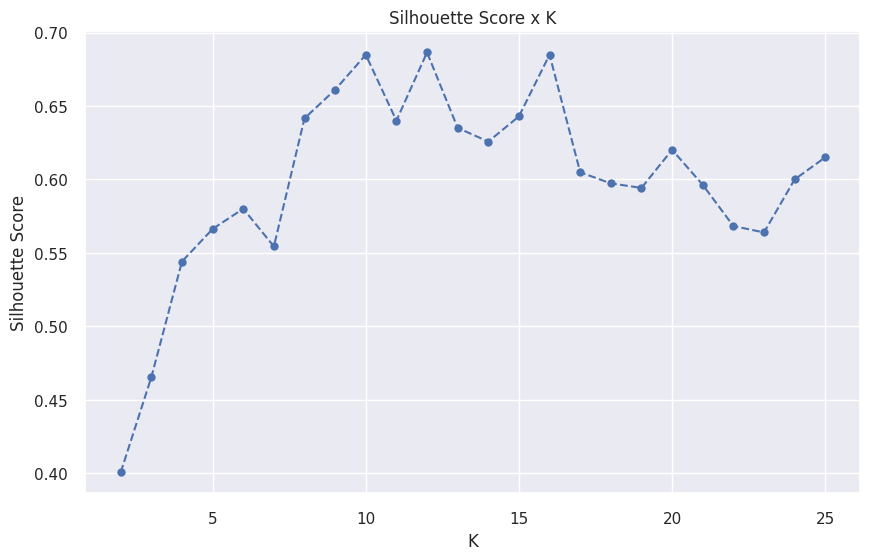

In [406]:
plt.figure( figsize = ( 10, 6 ))
plt.plot( clusters, gmm_scores, linestyle = '--', marker = 'o', color = 'b')
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 7.3. Hierarquical Clustering

In [407]:
# model definition and training
hc_model = hc.linkage( X, 'ward')

[]

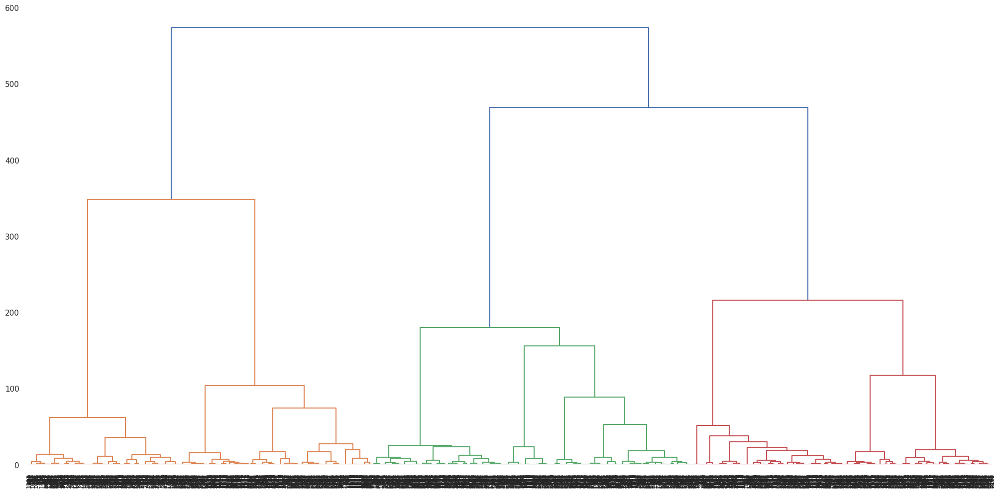

In [408]:
hc.dendrogram(
              hc_model,
              leaf_rotation = 90,
              leaf_font_size= 8
             )
plt.plot()

[]

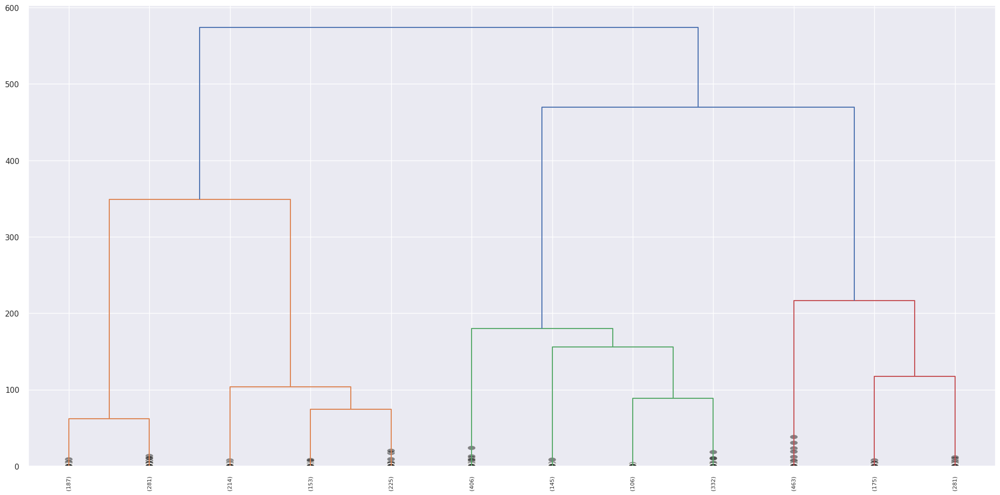

In [409]:
hc.dendrogram(
              hc_model,
              truncate_mode = 'lastp',
              p = 12,
              leaf_rotation = 90,
              leaf_font_size= 8,
              show_contracted = True
             )
plt.plot()

### 7.3.1. HClustering Sillhouette Score

In [232]:
hclustering_scores = []
for k in clusters:
    # model definition and training
    hc_model = hc.linkage( X , 'ward' )

    # model predict
    labels = hc.fcluster( hc_model, k, criterion = 'maxclust')

    # metrics
    sil = m.silhouette_score( X, labels, metric = 'euclidean' )
    hclustering_scores.append( sil )
    print ( "K = ", k, "Silhouette = ",sil )

K =  2 Silhouette =  0.39632767
K =  3 Silhouette =  0.46285123
K =  4 Silhouette =  0.47999144
K =  5 Silhouette =  0.5042661
K =  6 Silhouette =  0.5590952
K =  7 Silhouette =  0.59226245
K =  8 Silhouette =  0.5963954
K =  9 Silhouette =  0.61491644
K =  10 Silhouette =  0.6235322
K =  11 Silhouette =  0.6471119
K =  12 Silhouette =  0.64639497
K =  13 Silhouette =  0.65565675
K =  14 Silhouette =  0.64670324
K =  15 Silhouette =  0.6570255
K =  16 Silhouette =  0.66895366
K =  17 Silhouette =  0.6684862
K =  18 Silhouette =  0.6764055
K =  19 Silhouette =  0.6855577
K =  20 Silhouette =  0.68494457
K =  21 Silhouette =  0.7035624
K =  22 Silhouette =  0.7126815
K =  23 Silhouette =  0.71693456
K =  24 Silhouette =  0.7224761
K =  25 Silhouette =  0.7105523


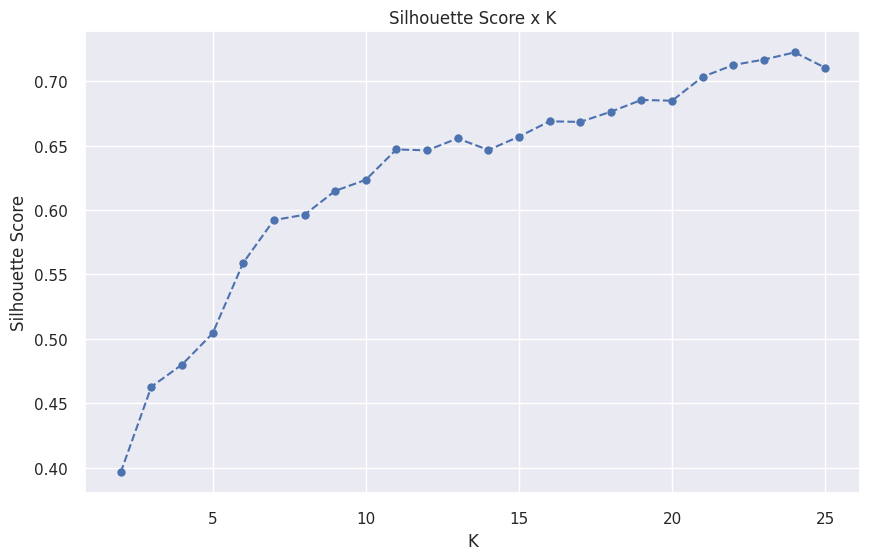

In [410]:
plt.figure( figsize = ( 10, 6 ))
plt.plot( clusters, hclustering_scores, linestyle = '--', marker = 'o', color = 'b')
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 7.4. DBSCAN

In [411]:
eps = 2.8
min_samples = 20

# model definition
dbscan_model = c.DBSCAN( eps = eps, min_samples = min_samples)

# model training and predict
labels = dbscan_model.fit_predict( X )

sil = m.silhouette_score( X, labels, metric = 'euclidean' )
print("Silhouette score:",sil)
print( "Number of clusters:", len(unique( labels ) ) ) 
print( unique(labels))
db_scores = [sil, 0, 0, 0, 0, 0]

Silhouette score: 0.63230914
Number of clusters: 11
[-1  0  1  2  3  4  5  6  7  8  9]


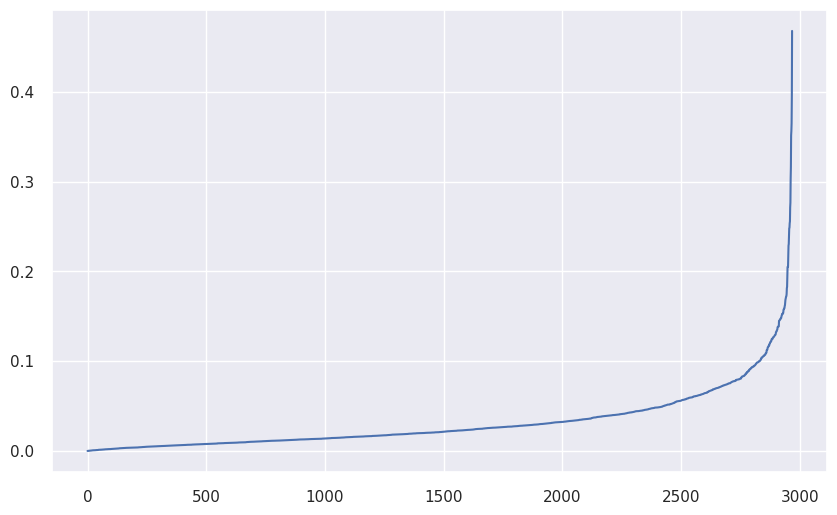

In [412]:
neighbors = NearestNeighbors( n_neighbors = min_samples ).fit( X )
distances, indexes = neighbors.kneighbors( X )
distances = np.sort( distances, axis = 0 )
distances = distances[:,1]
plt.figure( figsize = ( 10, 6 ))
plt.plot(distances)

## 7.5. Results

In [413]:
# Model Name | k=2 | k=3 | k=4 | k=5|...
# K-Means      ss    ss    ss    ss
# GMM          ss    ss    ss    ss
# Hie. Clus.   ss    ss    ss    ss
# DBSCAN       ss    ss    ss    ss

df_results = pd.DataFrame(
                         {'KMeans': kmeans_scores,
                          'GMM'   : gmm_scores,
                          'HC'    : hclustering_scores}#,'DBSCAN': db_scores}
                         ).T
df_results.columns = clusters

In [174]:
df_results.style.highlight_max(color = 'lightgreen', axis = 1)

,2,3,4,5,6,7
KMeans,0.717243,0.585024,0.551732,0.566845,0.540561,0.544500
GMM,0.040423,-0.008564,0.184380,-0.079714,-0.034889,-0.063922
HC,0.719044,0.560323,0.541673,0.553339,0.507190,0.513351
DBSCAN,0.609849,0.000000,0.000000,0.000000,0.000000,0.000000


In [414]:
df_results.style.highlight_max(color = 'lightgreen', axis = 1)

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
KMeans,0.395461,0.479287,0.550055,0.549233,0.592421,0.641810,0.640740,0.657557,0.681926,0.713209,0.685489,0.690800,0.694237,0.665023,0.669733,0.612733,0.624552,0.616727,0.612007,0.616553,0.636546,0.595980,0.619852,0.654068
GMM,0.400642,0.465438,0.544153,0.566306,0.580091,0.554424,0.641580,0.661093,0.684867,0.640050,0.686489,0.635099,0.625779,0.642944,0.684917,0.604914,0.597337,0.594252,0.620189,0.596356,0.568311,0.563945,0.600001,0.615085
HC,0.396328,0.462851,0.479991,0.504266,0.559095,0.592262,0.596395,0.614916,0.623532,0.647112,0.646395,0.655657,0.646703,0.657026,0.668954,0.668486,0.676405,0.685558,0.684945,0.703562,0.712681,0.716935,0.722476,0.710552


# 8.0. Model Training

## 8.1. K-Means

In [456]:
# Model definition
k = 8
kmeans = c.KMeans(init = 'random', n_clusters = k, n_init = 10, max_iter = 300)
# Model training
kmeans.fit( X )

# Clustering
labels = kmeans.predict( X )## 8.1. K-Means

## 8.2. Cluster Validation

In [457]:
## WSS (Within-cluster sum of square)
print("WSS value: {}".format( kmeans.inertia_))

## SS ( Silhouette Score)
print("SS value: {}".format ( m.silhouette_score(X, labels, metric = 'euclidean' ) ) )

WSS value: 22081.984375
SS value: 0.6407403349876404


# 9.0. Cluster Analysis

In [458]:
# ecommerce9 = ecommerce6.copy()
# ecommerce9['cluster'] = labels

X_analysis = X.copy()
X_analysis['cluster'] = labels

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

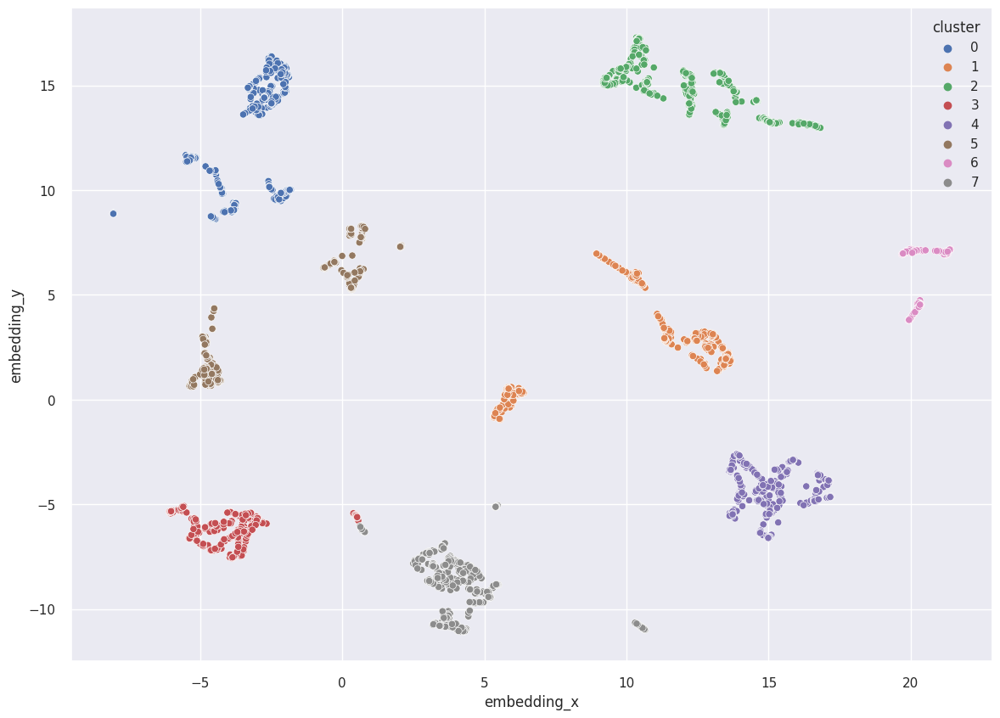

In [459]:
plt.figure(figsize=(14, 10))
sns.scatterplot(data = X_analysis, x='embedding_x',y='embedding_y', hue = 'cluster', palette = 'deep' )


## 9.1. Visual Inspection

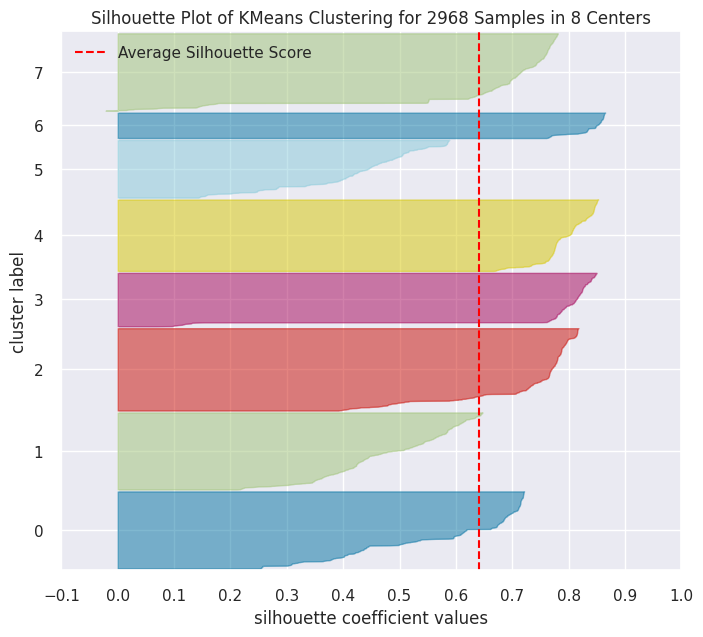

In [460]:
plt.figure(figsize=(8, 7))
visualizer = SilhouetteVisualizer (kmeans, colors = 'yellowbrick')
visualizer.fit( X )
visualizer.finalize()

## 9.2. 2d plot

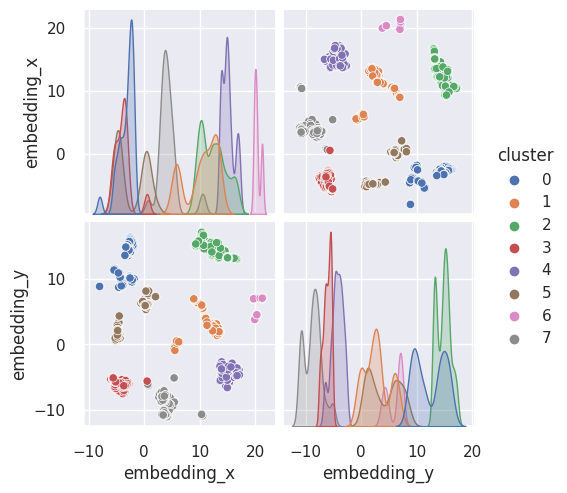

In [461]:
#df_viz = ecommerce9.drop(columns = 'customer_id', axis = 1)
sns.pairplot(X_analysis, hue = 'cluster', palette = 'deep')

## 9.3. UMAP

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

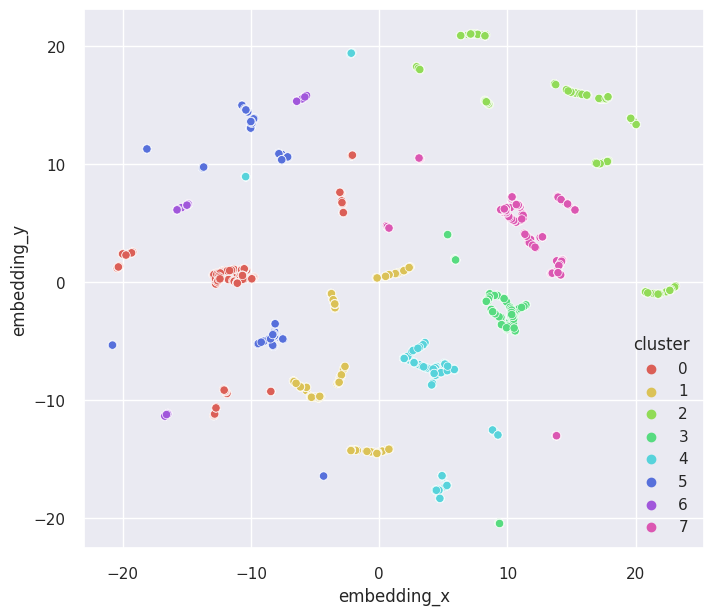

In [462]:
reducer = umap.UMAP( n_neighbors = 50, random_state = 42 )
embedding = reducer.fit_transform( X )

# embedding
df_viz['embedding_x'] = embedding[: , 0]
df_viz['embedding_y'] = embedding[: , 1]
df_viz['cluster'] = labels

# Plot UMAP
plt.figure(figsize=(8, 7))
sns.scatterplot( x = 'embedding_x', y = 'embedding_y',
                 hue = 'cluster',
                 palette = sns.color_palette('hls', n_colors = len( df_viz['cluster'].unique() ) ), 
                 data = df_viz )

## 9.2. Cluster Profile

In [468]:
ecommerce9 = ecommerce4.copy()
ecommerce9['cluster'] = labels
# Number of customers
no_customers = ecommerce9[['customer_id','cluster']].groupby('cluster').count().reset_index()
no_customers['percentage'] = ( no_customers['customer_id'] /  no_customers['customer_id'].sum() ) * 100

# AVG Gross Revenue
class_gross_revenue = ecommerce9[['gross_revenue','cluster']].groupby('cluster').mean().reset_index().rename(columns = {'gross_revenue':'avg_gross_revenue'})
df_cluster = pd.merge(no_customers, class_gross_revenue, how = 'inner', on = 'cluster')

# AVG Recency days
class_recency = ecommerce9[['recency','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, class_recency, how = 'inner', on = 'cluster')

# AVG invoices
class_invoices = ecommerce9[['qtty_products','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, class_invoices, how = 'inner', on = 'cluster')

# Frequency
class_frequency = ecommerce9[['frequency','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, class_frequency, how = 'inner', on = 'cluster')

# Returns
class_returns = ecommerce9[['qtty_returns','cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, class_returns, how = 'inner', on = 'cluster')

# Percentual Gross Revenue
perc_gross_revenue = ecommerce9[['gross_revenue','cluster']].groupby('cluster').sum().reset_index()
perc_gross_revenue['percentual_gross_revenue'] = ( perc_gross_revenue['gross_revenue'] /  perc_gross_revenue['gross_revenue'].sum() ) * 100
df_cluster = pd.merge(df_cluster, perc_gross_revenue, how = 'inner', on = 'cluster')

In [469]:
df_cluster

,cluster,customer_id,percentage,avg_gross_revenue,recency,qtty_products,frequency,qtty_returns,gross_revenue,percentual_gross_revenue
0,0,439,14.791105,524.247289,117.685649,11.316629,0.167308,6.917995,230144.56,2.878871
1,1,438,14.757412,2247.612397,49.312785,113.456621,0.051523,24.267123,984454.23,12.314508
2,2,468,15.768194,8836.136389,21.438034,424.134615,0.067650,149.271368,4135311.83,51.728489
3,3,304,10.242588,970.496842,74.371711,37.101974,0.056065,5.299342,295031.04,3.690534
4,4,406,13.679245,1689.882315,54.731527,89.290640,0.049327,11.504926,686092.22,8.582307
5,5,328,11.051213,739.318720,98.996951,24.734756,0.088278,14.743902,242496.54,3.033382
6,6,145,4.885445,3164.253379,34.427586,173.875862,0.087495,23.482759,458816.74,5.739325
7,7,440,14.824798,2186.173864,57.456818,68.981818,0.039338,12.502273,961916.50,12.032584


### Cluster 01: (Insider Candidades)
    - Customers: 6 (0.14% of the customers)
    - AVG Recency: 7 days
    - AVG invoices: 89
    - AVG Revenue: $ 182.108.000
    
### Cluster 02:
    - Customers: 31 (0.71% of the customers)
    - AVG Recency: 14 days
    - AVG invoices: 53
    - AVG Revenue: $ 40.543,52
    
### Cluster 03: 
    - Customers: 4335 (99% of the customers)
    - AVG Recency: 92 days
    - AVG invoices: 5
    - AVG Revenue: $ 1.372,57

# 10.0. Deploy to Production